In [1]:
import pandas as pd
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

from sklearn.inspection import plot_partial_dependence
from pycebox.ice import ice, ice_plot
from alepython import ale_plot

from sklearn.linear_model import LogisticRegression
import lime
import lime.lime_tabular
from sklearn.neighbors import KNeighborsClassifier

# DATA
* V1: Recency - months since last donation
* V2: Frequency - total number of donation
* V3: Monetary - total blood donated in c.c.
* V4: Time - months since first donation), and a binary variable representing whether he/she donated blood in March 2007 (1 stand for donating blood; 0 stands for not donating blood).
* Class - The target attribute is a binary variable representing whether he/she donated blood in March 2007 (2 stands for donating blood; 1 stands for not donating blood).


# PREPROCESSING

In [2]:
# read csv
data = pd.read_csv('blood.csv', names=["recency","frequency","monetary","time","Class"], header=0)

# scale numeric values
scaler = preprocessing.MinMaxScaler()
data[['recency', 'frequency', 'monetary', 'time']] = scaler.fit_transform(data[['recency', 'frequency', 'monetary', 'time']])

# adjust Class
data['Class'] = data['Class'] - 1

# splitting
temp_x, f2_x, temp_y, f2_y = train_test_split(data[['recency', 'frequency', 'monetary', 'time']], data['Class'], test_size=0.33, random_state=42)
f1_x, f3_x, f1_y, f3_y = train_test_split(temp_x, temp_y, test_size=0.5, random_state=42)
X = [f1_x, f2_x, f3_x]
Y = [f1_y, f2_y, f3_y]

# METHODS

In [3]:
def make_tree(x,y,test_x):
    dtree = DecisionTreeClassifier(random_state=42)
    dtree.fit(x,y)
    prediction = dtree.predict(test_x)
    return dtree, prediction

In [4]:
def make_svm(x,y,test_x):
    svm = SVC(random_state=42, probability=True)
    svm.fit(x,y)
    prediction = svm.predict(test_x)
    return svm, prediction

In [5]:
def pcp_do(dtree, x_train, y_train, x_test):
    for a in range(len(x_train.columns)):
        plot_partial_dependence(dtree, x_test, [a])

In [6]:
def ice_do(dtree, x_train, y_train, x_test):
    for a in (x_train.columns):
        ice_df = ice(x_test, a, dtree.predict, num_grid_points=100)
        ice_plot(ice_df)

In [7]:
def ale_do(dtree, x_train, y_train, x_test):
    for a in (x_train.columns):
        ale_plot(dtree, x_test, a)

In [8]:
from sklearn.metrics import precision_score, recall_score

In [9]:
data.head()

,recency,frequency,monetary,time,Class
0,0.027027,1.000000,1.000000,1.000000,1
1,0.000000,0.244898,0.244898,0.270833,1
2,0.013514,0.306122,0.306122,0.343750,1
3,0.027027,0.387755,0.387755,0.447917,1
4,0.013514,0.469388,0.469388,0.781250,0


In [10]:
data[data.columns[:-2]]

,recency,frequency,monetary
0,0.027027,1.000000,1.000000
1,0.000000,0.244898,0.244898
2,0.013514,0.306122,0.306122
3,0.027027,0.387755,0.387755
4,0.013514,0.469388,0.469388
...,...,...,...
743,0.310811,0.020408,0.020408
744,0.283784,0.020408,0.020408
745,0.310811,0.040816,0.040816
746,0.527027,0.000000,0.000000


In [11]:
def surrogate_do(blackbox, x_train, y_train, x_test, y_test, x_test_prediction, hist=False):
    # creating a data set to train and evaluate the logistic regression on
    # lreg is trained on blackbox labels -> generated by predicting on x_test with blackbox -> x_test_prediction
    # to evaluate lreg, its train set is further split into train/test
    temp = pd.concat([x_test.reset_index(drop=True), pd.DataFrame(y_test).reset_index(drop=True), pd.DataFrame(x_test_prediction).reset_index(drop=True)], axis=1, ignore_index=True)
    x_train_lreg, x_test_lreg, y_train_lreg, y_test_lreg = train_test_split(temp[temp.columns[:-2]], temp[temp.columns[-2:]], test_size=0.5, random_state=42)
    y_train_blackbox_preds = y_train_lreg[y_train_lreg.columns[1]] # part of labels blackbox made (train lreg on this)
    y_test_blackbox_preds = y_test_lreg[y_test_lreg.columns[1]] # part of labels blackbox made (test lreg on this)
    y_test_truth_values = y_test_lreg[y_test_lreg.columns[0]] # true value for the same datapoints as line above
        
    # fit explanable model with blackbox predictions as labels
    lreg = LogisticRegression()
    lreg.fit(x_train_lreg, y_train_blackbox_preds)
    lreg_preds = lreg.predict(x_test_lreg)
    
    # how well does lreg predict the blackbox outcomes?
    lreg_precision = precision_score(y_test_blackbox_preds, lreg_preds)
    lreg_recall = recall_score(y_test_blackbox_preds, lreg_preds)
    print("Predicting blackbox outcomes:")
    print("precision:", lreg_precision)
    print("recall:", lreg_recall)
    
    # how well does the lreg predict the original data compared to the blackbox?
    lreg_precision = precision_score(y_test_truth_values, lreg_preds)
    lreg_recall = recall_score(y_test_truth_values, lreg_preds)
    blackbox_recall = recall_score(y_test_truth_values, y_test_blackbox_preds)
    blackbox_precision = precision_score(y_test_truth_values, y_test_blackbox_preds)
    print("\nComparing lreg to blackbox")
    print("lreg precision:", lreg_precision)
    print("blackbox precision:", blackbox_precision)
    print("lreg recall:", lreg_recall)
    print("blackbox recall:", blackbox_recall)
    
    # TODO how to print histograms without overlap?
    if hist:
        for a in x_train.columns:
            x_test[a].hist()
        
    # how well does the model explain -> look at coeffs
    return lreg.intercept_, lreg.coef_

In [12]:
def lime_do(dtree, x_test, sample=10):
    explainer = lime.lime_tabular.LimeTabularExplainer(x_test.to_numpy())
    exp = explainer.explain_instance(x_test.iloc[sample], dtree.predict_proba, num_features=4)
    exp.show_in_notebook(show_table=True, show_all=False)

In [13]:
def counterfactuals_do(x_test, prediction, top_k=3, sample=10):
    knn = KNeighborsClassifier()
    knn.fit(x_test, prediction)
    dist, neighbors_idx = knn.kneighbors([x_test.iloc[sample]], n_neighbors=len(x_test))    
    candidates = pd.concat([x_test.iloc[neighbors_idx[0]].reset_index(drop=True), pd.DataFrame(prediction[neighbors_idx[0]])], axis=1, ignore_index=True)
    return candidates[candidates[4] != prediction[sample]].head(top_k), x_test.iloc[sample]

# GENERATE CV FOLDS

In [14]:
# generate splits
f1_x_train = pd.concat([X[1], X[2]])
f1_y_train = pd.concat([Y[1], Y[2]])
f1_x_test = X[0]
f1_y_test = Y[0]
f2_x_train = pd.concat([X[0], X[2]])
f2_y_train = pd.concat([Y[0], Y[2]])
f2_x_test = X[1]
f2_y_test = Y[1]
f3_x_train = pd.concat([X[0], X[1]])
f3_y_train = pd.concat([Y[0], Y[1]])
f3_x_test = X[2]
f3_y_test = Y[2]

# CALCULATE DTREE PREDICTIONS

In [15]:
# make trees, generate predictions
f1_dtree, f1_prediction = make_tree(f1_x_train, f1_y_train, f1_x_test)
f2_dtree, f2_prediction = make_tree(f2_x_train, f2_y_train, f2_x_test)
f3_dtree, f3_prediction = make_tree(f3_x_train, f3_y_train, f3_x_test)

# FOLD 1

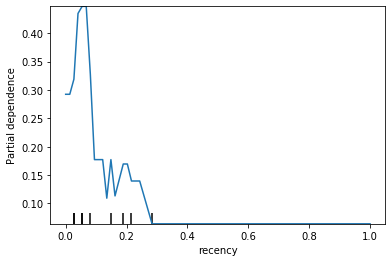

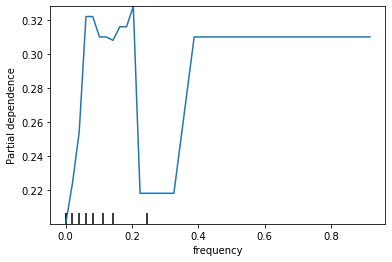

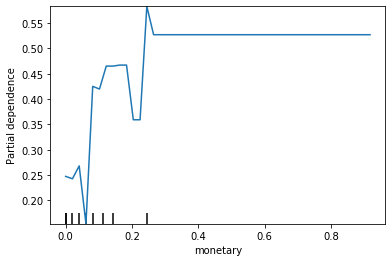

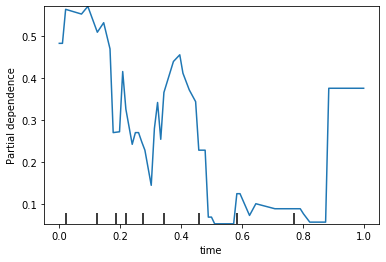

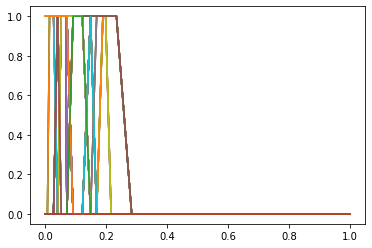

...

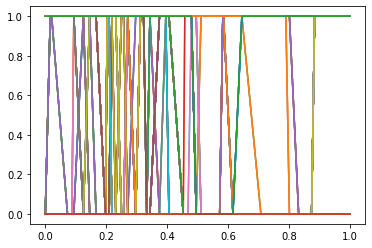

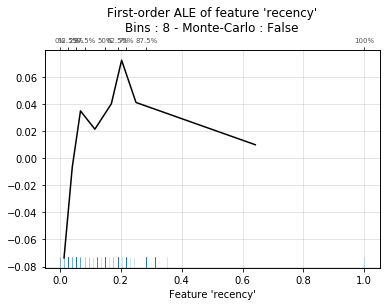

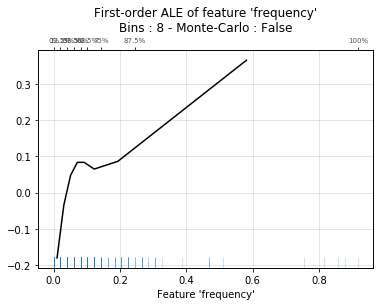

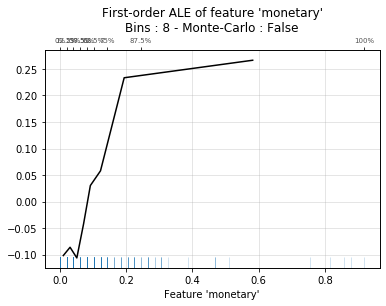

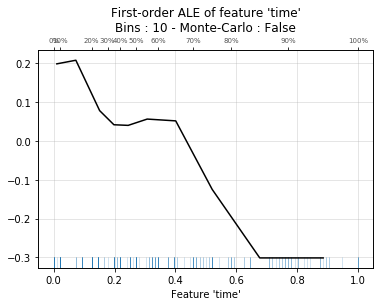

In [16]:
pcp_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)
ice_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)
ale_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)

In [17]:
surrogate_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test, f1_y_test, f1_prediction)
lime_do(f1_dtree, f1_x_test)
counterfactuals_do(f1_x_test, f1_prediction)

Predicting blackbox outcomes:
precision: 0.6666666666666666
recall: 0.05714285714285714

Comparing lreg to blackbox
lreg precision: 0.3333333333333333
blackbox precision: 0.34285714285714286
lreg recall: 0.04
blackbox recall: 0.48


(           0         1         2         3  4
 3   0.148649  0.142857  0.142857  0.520833  1
 10  0.148649  0.081633  0.081633  0.375000  1
 13  0.135135  0.081633  0.081633  0.375000  1,
 recency      0.189189
 frequency    0.142857
 monetary     0.142857
 time         0.458333
 Name: 649, dtype: float64)

# FOLD 2

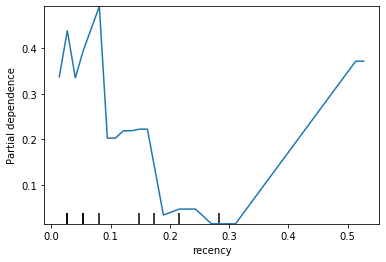

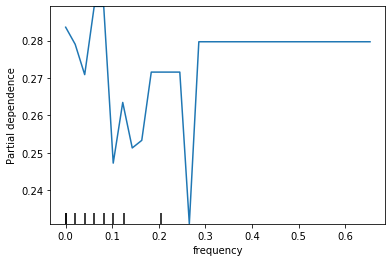

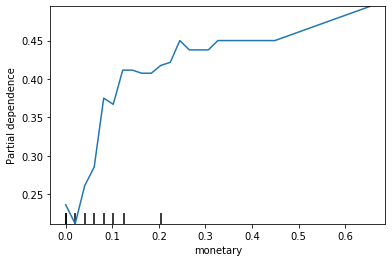

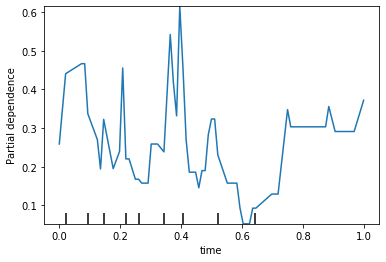

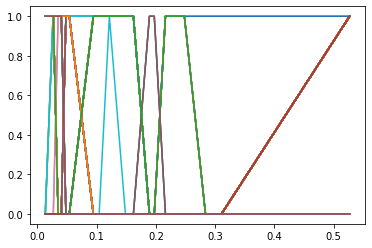

...

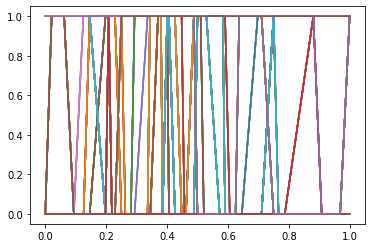

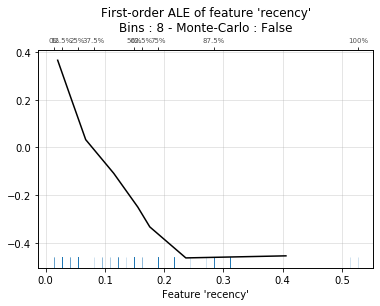

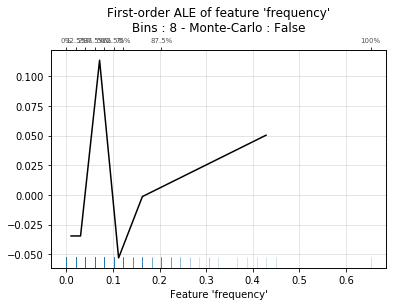

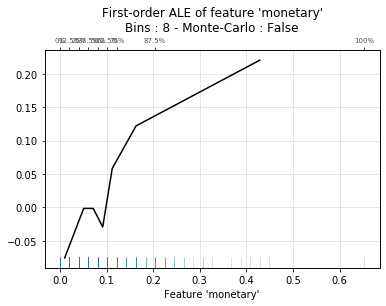

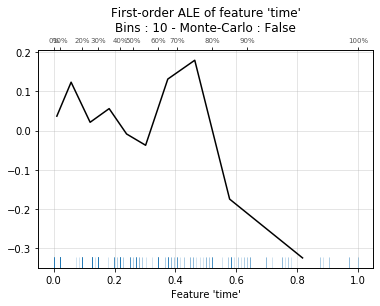

In [18]:
pcp_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)
ice_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)
ale_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)

In [19]:
surrogate_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test, f2_y_test, f2_prediction)
lime_do(f2_dtree, f2_x_test)
counterfactuals_do(f2_x_test, f2_prediction)

/home/dude/anaconda3/envs/speml2/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting blackbox outcomes:
precision: 0.0
recall: 0.0

Comparing lreg to blackbox
lreg precision: 0.0
blackbox precision: 0.32
lreg recall: 0.0
blackbox recall: 0.21621621621621623


(          0         1         2        3  4
 1  0.027027  0.142857  0.142857  0.34375  1
 2  0.027027  0.204082  0.204082  0.40625  1
 8  0.013514  0.224490  0.224490  0.34375  1,
 recency      0.054054
 frequency    0.163265
 monetary     0.163265
 time         0.375000
 Name: 97, dtype: float64)

# FOLD 3

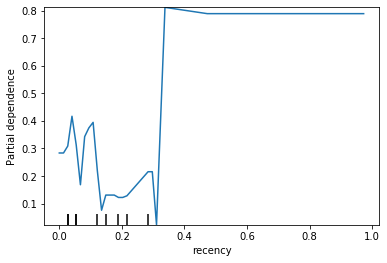

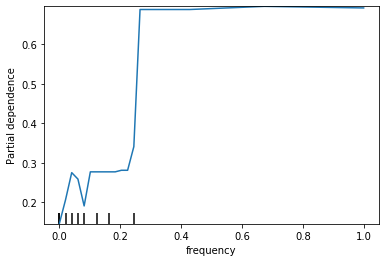

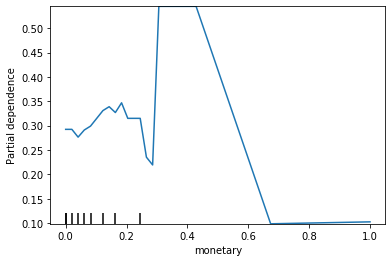

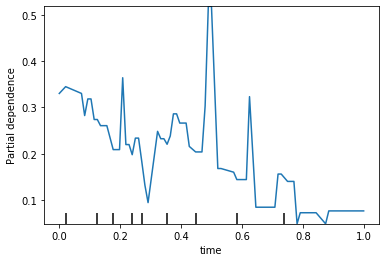

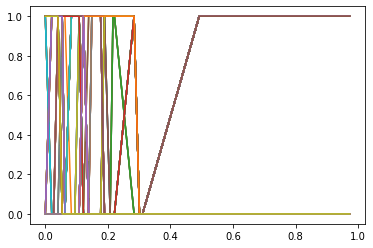

...

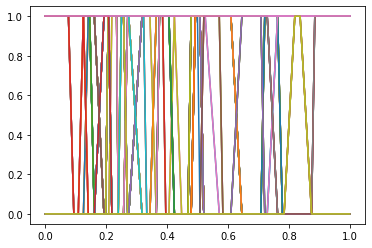

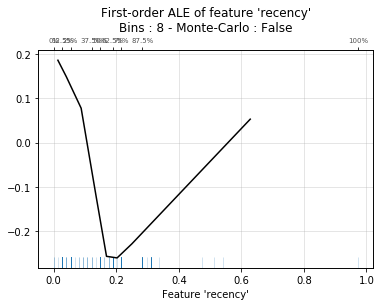

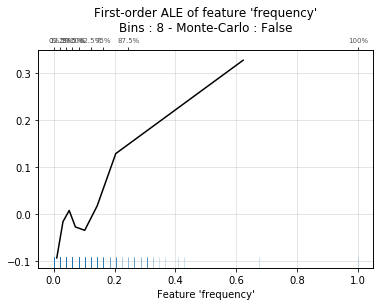

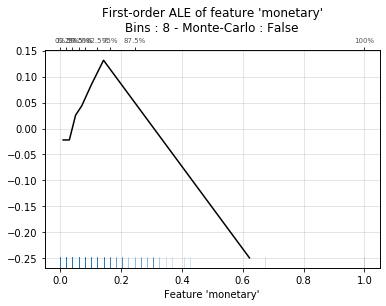

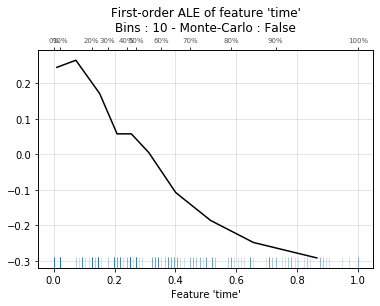

In [20]:
pcp_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)
ice_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)
ale_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)

In [21]:
surrogate_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test, f3_y_test, f3_prediction)
lime_do(f3_dtree, f3_x_test)
counterfactuals_do(f3_x_test, f3_prediction)

/home/dude/anaconda3/envs/speml2/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting blackbox outcomes:
precision: 0.0
recall: 0.0

Comparing lreg to blackbox
lreg precision: 0.0
blackbox precision: 0.4444444444444444
lreg recall: 0.0
blackbox recall: 0.32


(           0         1         2         3  4
 27  0.027027  0.040816  0.040816  0.020833  1
 28  0.000000  0.040816  0.040816  0.020833  1
 43  0.054054  0.061224  0.061224  0.125000  1,
 recency      0.027027
 frequency    0.000000
 monetary     0.000000
 time         0.000000
 Name: 587, dtype: float64)

# CALCULATE SVM PREDICTIONS

In [22]:
# make trees, generate predictions
f1_svm, f1_prediction = make_svm(f1_x_train, f1_y_train, f1_x_test)
f2_svm, f2_prediction = make_svm(f2_x_train, f2_y_train, f2_x_test)
f3_svm, f3_prediction = make_svm(f3_x_train, f3_y_train, f3_x_test)

# FOLD 1

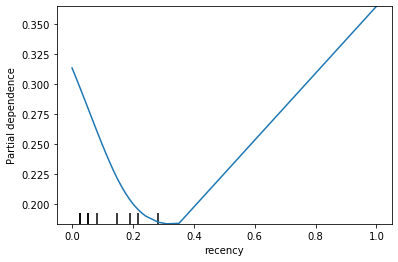

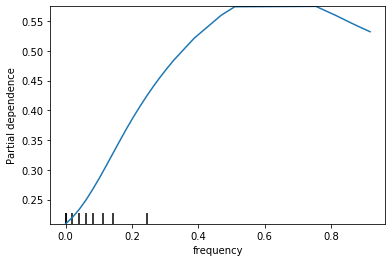

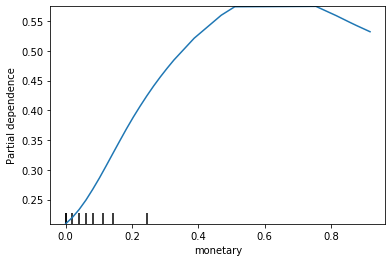

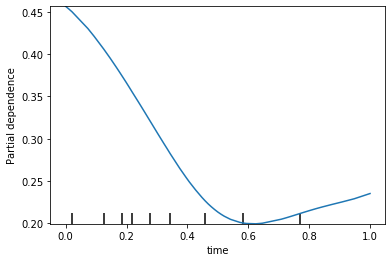

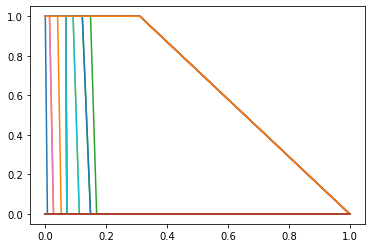

...

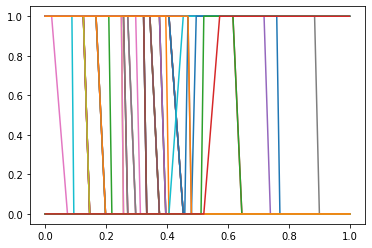

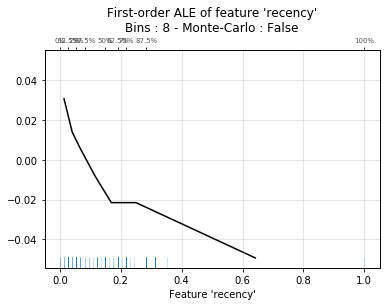

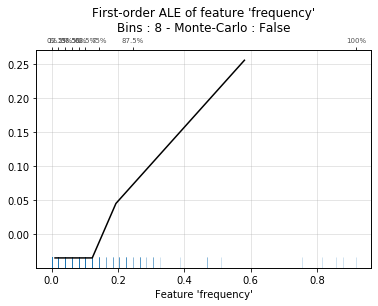

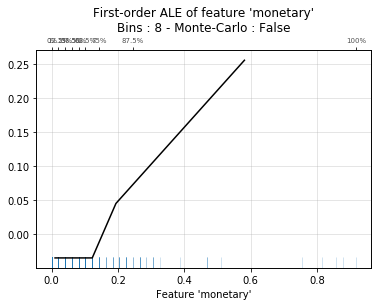

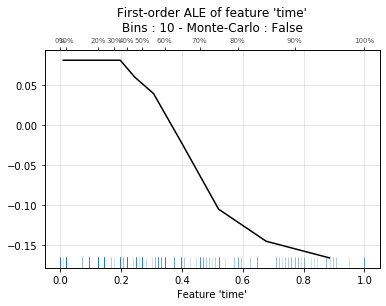

In [23]:
pcp_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)
ice_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)
ale_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)

In [24]:
surrogate_do(f1_svm, f1_x_train, f1_y_train, f1_x_test, f1_y_test, f1_prediction)
lime_do(f1_svm, f1_x_test)
counterfactuals_do(f1_x_test, f1_prediction)

/home/dude/anaconda3/envs/speml2/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting blackbox outcomes:
precision: 0.0
recall: 0.0

Comparing lreg to blackbox
lreg precision: 0.0
blackbox precision: 0.5
lreg recall: 0.0
blackbox recall: 0.16


(           0         1         2         3  4
 65  0.054054  0.224490  0.224490  0.333333  1
 73  0.054054  0.265306  0.265306  0.395833  1
 82  0.054054  0.183673  0.183673  0.270833  1,
 recency      0.189189
 frequency    0.142857
 monetary     0.142857
 time         0.458333
 Name: 649, dtype: float64)

# FOLD 2

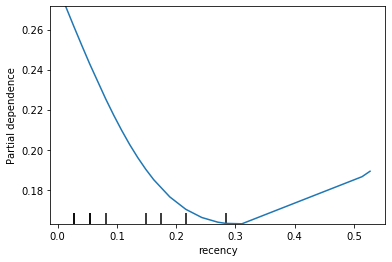

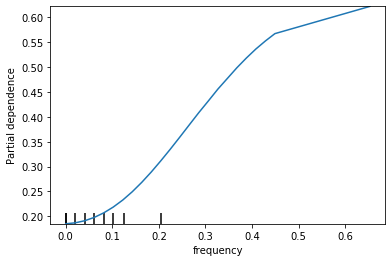

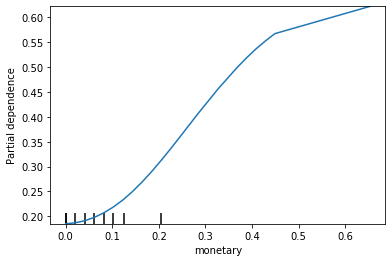

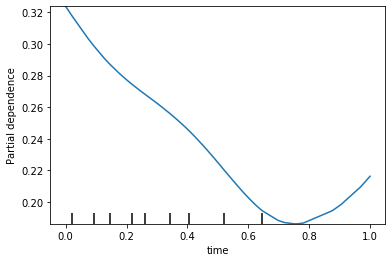

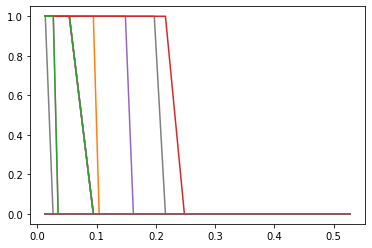

...

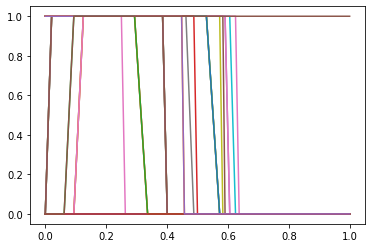

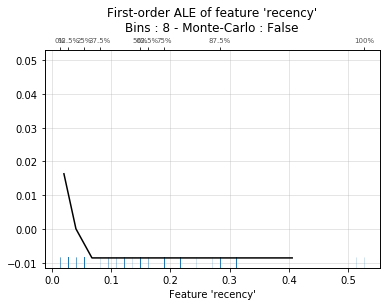

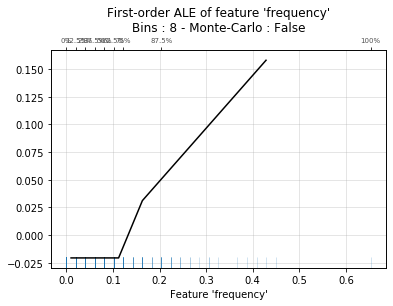

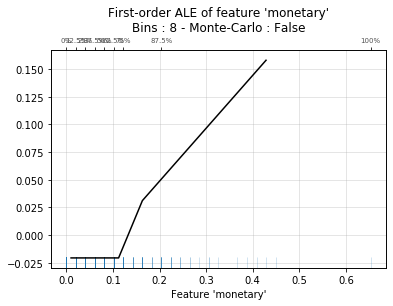

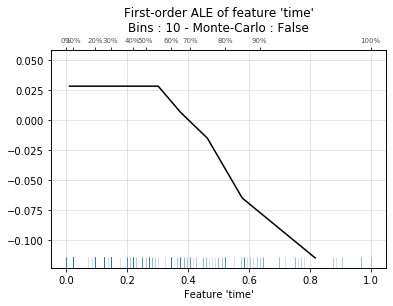

In [25]:
pcp_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)
ice_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)
ale_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)

In [26]:
surrogate_do(f2_svm, f2_x_train, f2_y_train, f2_x_test, f2_y_test, f2_prediction)
lime_do(f2_svm, f2_x_test)
counterfactuals_do(f2_x_test, f2_prediction)

/home/dude/anaconda3/envs/speml2/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting blackbox outcomes:
precision: 0.0
recall: 0.0

Comparing lreg to blackbox
lreg precision: 0.0
blackbox precision: 0.5
lreg recall: 0.0
blackbox recall: 0.05405405405405406


(           0         1         2         3  4
 8   0.013514  0.224490  0.224490  0.343750  1
 16  0.027027  0.204082  0.204082  0.270833  1
 24  0.027027  0.204082  0.204082  0.250000  1,
 recency      0.054054
 frequency    0.163265
 monetary     0.163265
 time         0.375000
 Name: 97, dtype: float64)

# FOLD 3

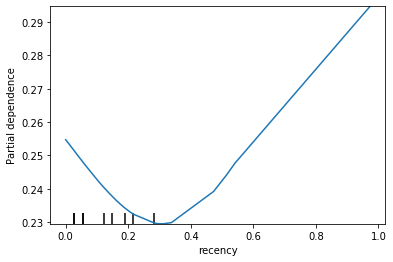

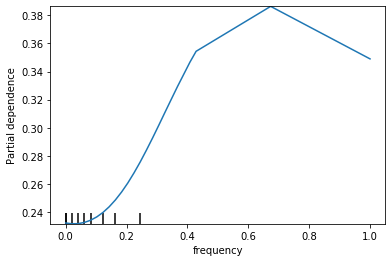

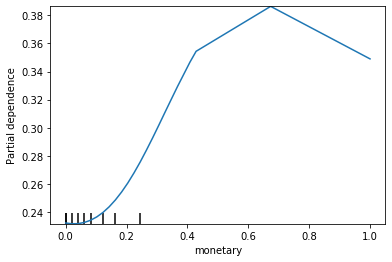

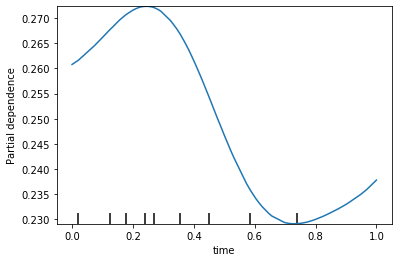

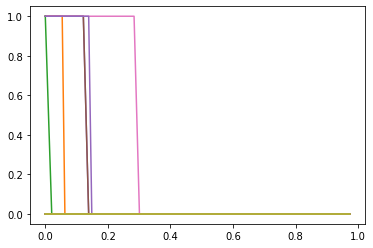

...

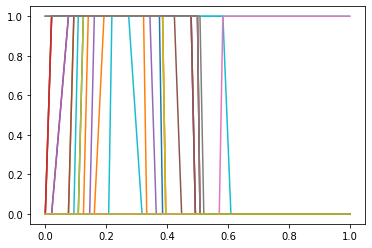

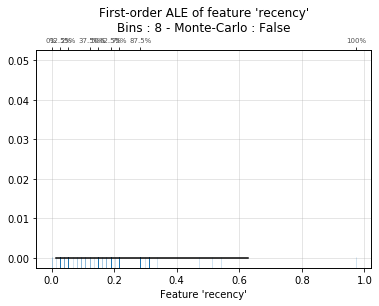

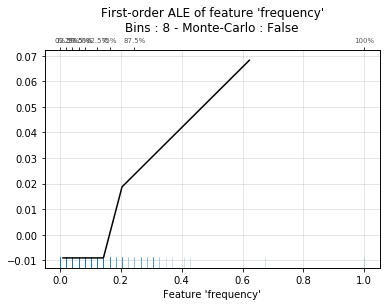

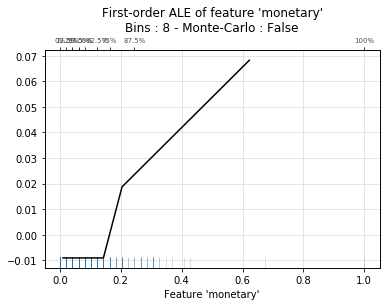

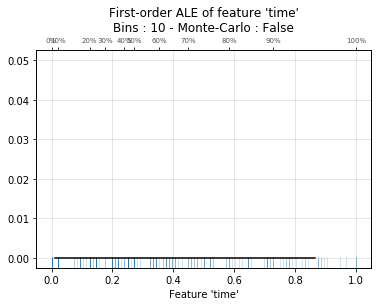

In [27]:
pcp_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)
ice_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)
ale_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)

In [28]:
surrogate_do(f3_svm, f3_x_train, f3_y_train, f3_x_test, f3_y_test, f3_prediction)
lime_do(f3_svm, f3_x_test)
counterfactuals_do(f3_x_test, f3_prediction)

/home/dude/anaconda3/envs/speml2/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting blackbox outcomes:
precision: 0.0
recall: 0.0

Comparing lreg to blackbox
lreg precision: 0.0
blackbox precision: 1.0
lreg recall: 0.0
blackbox recall: 0.08


(            0         1         2         3  4
 155  0.000000  0.244898  0.244898  0.270833  1
 187  0.054054  0.306122  0.306122  0.375000  1
 218  0.027027  0.408163  0.408163  0.520833  1,
 recency      0.027027
 frequency    0.000000
 monetary     0.000000
 time         0.000000
 Name: 587, dtype: float64)